<a href="https://colab.research.google.com/github/aguilargallardo/aguilargallardo/blob/master/Unit_1_Build_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**SUMMARY**

#Hello everyone! Check out my latest blog post! I go and break down data using data science tools to answer the following question! What games on the video game digital distribution client, Steam, was the most positively rated in the first half of the year 2019 and why?

# **Steam Dataset**



This is a dataset from the kaggle website. [Steam Dataset-Author: nikdavis](https://www.kaggle.com/nikdavis/steam-store-games)

This dataset contains 27,000 different games with 18 columns providing different information on the games such as publisher, developer, price, ratings, categories, genres, playtime, name, and more...

In [1]:
!wget "https://docs.google.com/spreadsheets/d/e/2PACX-1vTQjASkIj5VhuJ-cZnrOewESc4V3g6BX4Ic4WGyyNnzTObTIauZ7R6qeu7JwJYZSAne16GLoIRpJyaO/pub?output=csv"

--2019-11-22 00:04:18--  https://docs.google.com/spreadsheets/d/e/2PACX-1vTQjASkIj5VhuJ-cZnrOewESc4V3g6BX4Ic4WGyyNnzTObTIauZ7R6qeu7JwJYZSAne16GLoIRpJyaO/pub?output=csv
Resolving docs.google.com (docs.google.com)... 74.125.20.101, 74.125.20.138, 74.125.20.100, ...
Connecting to docs.google.com (docs.google.com)|74.125.20.101|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/csv]
Saving to: ‘pub?output=csv.5’

pub?output=csv.5        [   <=>              ]   5.54M  13.2MB/s    in 0.4s    

2019-11-22 00:04:18 (13.2 MB/s) - ‘pub?output=csv.5’ saved [5809557]



In [0]:
import pandas as pd

df= pd.read_csv('pub?output=csv')

In [3]:
print(df.shape)
df.head()

(27075, 18)


,appid,name,release_date,english,developer,publisher,platforms,required_age,categories,genres,steamspy_tags,achievements,positive_ratings,negative_ratings,average_playtime,median_playtime,owners,price
0,10,Counter-Strike,2000-11-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,124534,3339,17612,317,10000000-20000000,7.19
1,20,Team Fortress Classic,1999-04-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,3318,633,277,62,5000000-10000000,3.99
2,30,Day of Defeat,2003-05-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Valve Anti-Cheat enabled,Action,FPS;World War II;Multiplayer,0,3416,398,187,34,5000000-10000000,3.99
3,40,Deathmatch Classic,2001-06-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,1273,267,258,184,5000000-10000000,3.99
4,50,Half-Life: Opposing Force,1999-11-01,1,Gearbox Software,Valve,windows;mac;linux,0,Single-player;Multi-player;Valve Anti-Cheat en...,Action,FPS;Action;Sci-fi,0,5250,288,624,415,5000000-10000000,3.99


In [4]:
df.isnull().sum()

appid               0
name                0
release_date        0
english             0
developer           0
publisher           6
platforms           0
required_age        0
categories          0
genres              0
steamspy_tags       0
achievements        0
positive_ratings    0
negative_ratings    0
average_playtime    0
median_playtime     0
owners              0
price               0
dtype: int64

In [5]:
df.dtypes

appid                 int64
name                 object
release_date         object
english               int64
developer            object
publisher            object
platforms            object
required_age          int64
categories           object
genres               object
steamspy_tags        object
achievements          int64
positive_ratings      int64
negative_ratings      int64
average_playtime      int64
median_playtime       int64
owners               object
price               float64
dtype: object

In [0]:
import seaborn as sns
import matplotlib.pyplot as plt
import datetime
from datetime import date
import pandas as pd
import numpy as np
from plotly import __version__
%matplotlib inline

import plotly.offline as pyo
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot 


#cf.go_offline()

#Positive Rated Games

In [7]:
#Set Conditions to sort df for top 10 positive rated games
condition = df.positive_ratings >= 360000
condition2= df.positive_ratings >= 251700
df3 = df[condition]
df4 = df[condition2].sort_values(by='positive_ratings', ascending=False)
df4

,appid,name,release_date,english,developer,publisher,platforms,required_age,categories,genres,steamspy_tags,achievements,positive_ratings,negative_ratings,average_playtime,median_playtime,owners,price
25,730,Counter-Strike: Global Offensive,2012-08-21,1,Valve;Hidden Path Entertainment,Valve,windows;mac;linux,0,Multi-player;Steam Achievements;Full controlle...,Action;Free to Play,FPS;Multiplayer;Shooter,167,2644404,402313,22494,6502,50000000-100000000,0.00
22,570,Dota 2,2013-07-09,1,Valve,Valve,windows;mac;linux,0,Multi-player;Co-op;Steam Trading Cards;Steam W...,Action;Free to Play;Strategy,Free to Play;MOBA;Strategy,0,863507,142079,23944,801,100000000-200000000,0.00
19,440,Team Fortress 2,2007-10-10,1,Valve,Valve,windows;mac;linux,0,Multi-player;Cross-Platform Multiplayer;Steam ...,Action;Free to Play,Free to Play;Multiplayer;FPS,520,515879,34036,8495,623,20000000-50000000,0.00
12836,578080,PLAYERUNKNOWN'S BATTLEGROUNDS,2017-12-21,1,PUBG Corporation,PUBG Corporation,windows,0,Multi-player;Online Multi-Player;Stats,Action;Adventure;Massively Multiplayer,Survival;Shooter;Multiplayer,37,496184,487076,22938,12434,50000000-100000000,26.99
121,4000,Garry's Mod,2006-11-29,1,Facepunch Studios,Valve,windows;mac;linux,0,Single-player;Multi-player;Co-op;Cross-Platfor...,Indie;Simulation,Sandbox;Multiplayer;Funny,29,363721,16433,12422,1875,10000000-20000000,6.99
2478,271590,Grand Theft Auto V,2015-04-13,1,Rockstar North,Rockstar Games,windows,18,Single-player;Multi-player;Steam Achievements;...,Action;Adventure,Open World;Action;Multiplayer,77,329061,139308,9837,4834,10000000-20000000,24.99
1467,218620,PAYDAY 2,2013-08-13,1,OVERKILL - a Starbreeze Studio.,Starbreeze Publishing AB,windows;linux,18,Single-player;Multi-player;Co-op;Online Co-op;...,Action;RPG,Co-op;Action;FPS,1130,308657,56523,3975,890,10000000-20000000,7.49
3362,304930,Unturned,2017-07-07,1,Smartly Dressed Games,Smartly Dressed Games,windows;mac;linux,0,Single-player;Online Multi-Player;Online Co-op...,Action;Adventure;Casual;Free to Play;Indie,Free to Play;Survival;Zombies,46,292574,31482,3248,413,20000000-50000000,0.00
1120,105600,Terraria,2011-05-16,1,Re-Logic,Re-Logic,windows;mac;linux,0,Single-player;Multi-player;Online Multi-Player...,Action;Adventure;Indie;RPG,Sandbox;Adventure;Survival,88,255600,7797,5585,1840,5000000-10000000,6.99
21,550,Left 4 Dead 2,2009-11-19,1,Valve,Valve,windows;mac;linux,0,Single-player;Multi-player;Co-op;Steam Achieve...,Action,Zombies;Co-op;FPS,70,251789,8418,1615,566,10000000-20000000,7.19


#Logos for Styling 

In [0]:
import matplotlib.image as mpimg
import pylab as pl


In [9]:
!wget 'https://cdn.freebiesupply.com/images/large/2x/steam-logo-transparent.png'

#Left4Dead2
!wget 'https://upload.wikimedia.org/wikipedia/en/thumb/b/ba/Left4Dead2.jpg/220px-Left4Dead2.jpg'
#Terraria
!wget 'https://carlisletheacarlisletheatre.org/images/terraria-logo-tree.jpg'
#Unturned
!wget 'https://www.logolynx.com/images/logolynx/79/794b7efe5d4114ad41e4f27cea1f04f9.png'
#Payday2
!wget 'https://i.pinimg.com/originals/74/e2/36/74e236ce1277ba7488b8b0a1f02459ec.jpg'
#GTAV
!wget 'https://vignette.wikia.nocookie.net/logopedia/images/9/99/Grand_Theft_Auto_IV.png/revision/latest?cb=20111006102549'
#Garry'sMod
!wget 'https://upload.wikimedia.org/wikipedia/commons/thumb/c/c7/Gmodlogo.svg/1200px-Gmodlogo.svg.png'
#PUBG
!wget 'https://i.pinimg.com/originals/f7/43/c4/f743c45a69f00a4d6254ce42f3803dd1.jpg'
#TeamFortress2
!wget 'https://ih1.redbubble.net/image.177016585.0687/mp,840x830,matte,f8f8f8,t-pad,750x1000,f8f8f8.jpg'
#Dota2
!wget 'https://seeklogo.com/images/D/dota-2-logo-7804D430C9-seeklogo.com.png'
#CSGO
!wget 'https://ih1.redbubble.net/image.455817861.0192/pp,650x642-pad,750x1000,f8f8f8.jpg'

--2019-11-22 00:04:20--  https://cdn.freebiesupply.com/images/large/2x/steam-logo-transparent.png
Resolving cdn.freebiesupply.com (cdn.freebiesupply.com)... 104.131.67.145
Connecting to cdn.freebiesupply.com (cdn.freebiesupply.com)|104.131.67.145|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 47373 (46K) [image/png]
Saving to: ‘steam-logo-transparent.png.4’

steam-logo-transpar 100%[===================>]  46.26K  --.-KB/s    in 0.06s   

2019-11-22 00:04:21 (750 KB/s) - ‘steam-logo-transparent.png.4’ saved [47373/47373]

--2019-11-22 00:04:21--  https://upload.wikimedia.org/wikipedia/en/thumb/b/ba/Left4Dead2.jpg/220px-Left4Dead2.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 208.80.154.240, 2620:0:861:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|208.80.154.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 24094 (24K) [image/jpeg]
Saving to: ‘220px-Left4Dead2.jpg.4’

220px-Left4Dead2.jp 100%[====

In [10]:
!wget 'https://ih0.redbubble.net/image.414596753.0043/aps,650x642,small,transparent-pad,750x1000,f8f8f8.jpg'
!wget 'https://ih1.redbubble.net/image.435661062.9169/flat,750x,075,f-pad,750x1000,f8f8f8.jpg'
!wget 'https://ih0.redbubble.net/image.300184721.4952/flat,1000x1000,075,f.u5.jpg'
!wget 'https://fontmeme.com/images/Dayz-Game.jpg'
!wget 'https://pbs.twimg.com/profile_images/1100543493229957123/YOkgmHHB_400x400.png'

--2019-11-22 00:04:30--  https://ih0.redbubble.net/image.414596753.0043/aps,650x642,small,transparent-pad,750x1000,f8f8f8.jpg
Resolving ih0.redbubble.net (ih0.redbubble.net)... 72.21.91.237
Connecting to ih0.redbubble.net (ih0.redbubble.net)|72.21.91.237|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 19498 (19K) [image/jpeg]
Saving to: ‘aps,650x642,small,transparent-pad,750x1000,f8f8f8.jpg.4’

aps,650x642,small,t 100%[===================>]  19.04K  --.-KB/s    in 0s      

2019-11-22 00:04:30 (179 MB/s) - ‘aps,650x642,small,transparent-pad,750x1000,f8f8f8.jpg.4’ saved [19498/19498]

--2019-11-22 00:04:30--  https://ih1.redbubble.net/image.435661062.9169/flat,750x,075,f-pad,750x1000,f8f8f8.jpg
Resolving ih1.redbubble.net (ih1.redbubble.net)... 72.21.91.237
Connecting to ih1.redbubble.net (ih1.redbubble.net)|72.21.91.237|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 23179 (23K) [image/jpeg]
Saving to: ‘flat,750x,075,f-pad,750x1000,f8

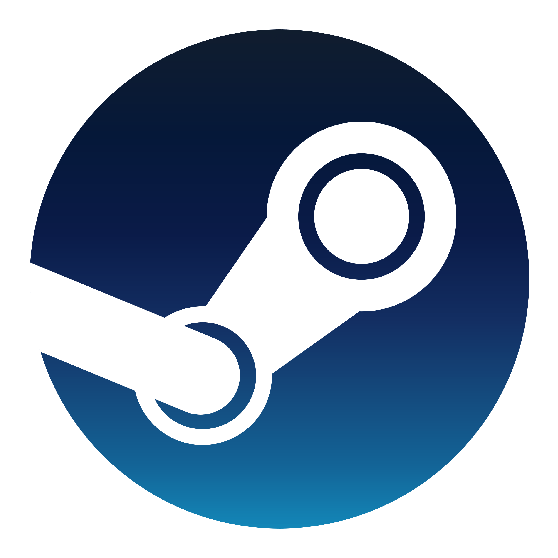

In [11]:
image_name = 'steam-logo-transparent.png'
im_data = mpimg.imread(image_name)

cmap = 'hot'
plt.figure(figsize=(15,10))
steam = plt.imshow(im_data, cmap=cmap, interpolation='nearest')
plt.axis('off')
plt.show()

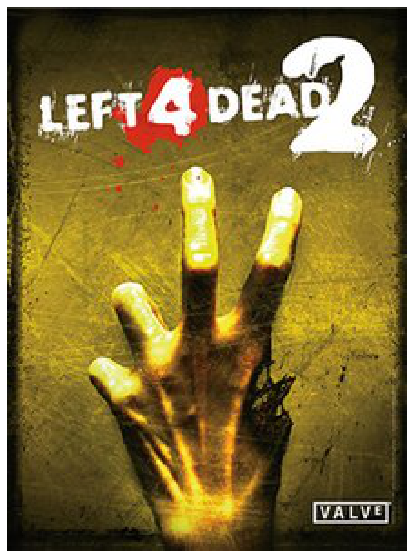

In [12]:
image_name1 = '220px-Left4Dead2.jpg'
im_data1 = mpimg.imread(image_name1)

cmap = 'hot'
plt.figure(figsize=(15,10))
plt.imshow(im_data1, cmap=cmap, interpolation='nearest')
plt.axis('off')
plt.show()

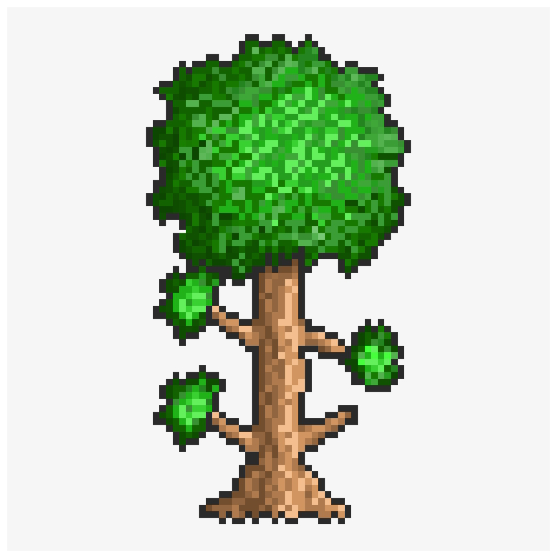

In [13]:
image_name2 = 'terraria-logo-tree.jpg'
im_data2 = mpimg.imread(image_name2)

cmap = 'hot'
plt.figure(figsize=(15,10))
plt.imshow(im_data2, cmap=cmap, interpolation='nearest')
plt.axis('off')
plt.show()

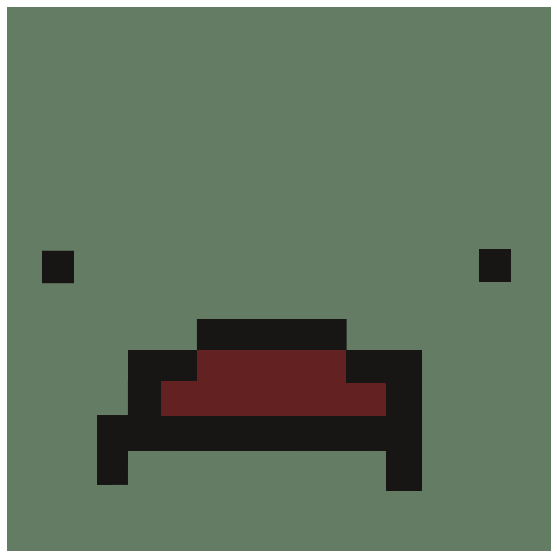

In [14]:
image_name3 = '794b7efe5d4114ad41e4f27cea1f04f9.png'
im_data3 = mpimg.imread(image_name3)

cmap = 'hot'
plt.figure(figsize=(15,10))
plt.imshow(im_data3, cmap=cmap, interpolation='nearest')
plt.axis('off')
plt.show()

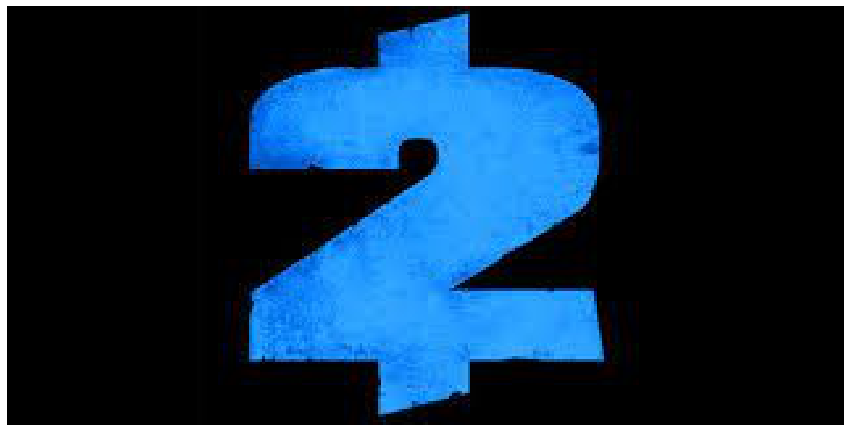

In [15]:
image_name4 = '74e236ce1277ba7488b8b0a1f02459ec.jpg'
im_data4 = mpimg.imread(image_name4)

cmap = 'hot'
plt.figure(figsize=(15,10))
plt.imshow(im_data4, cmap=cmap, interpolation='nearest')
plt.axis('off')
plt.show()

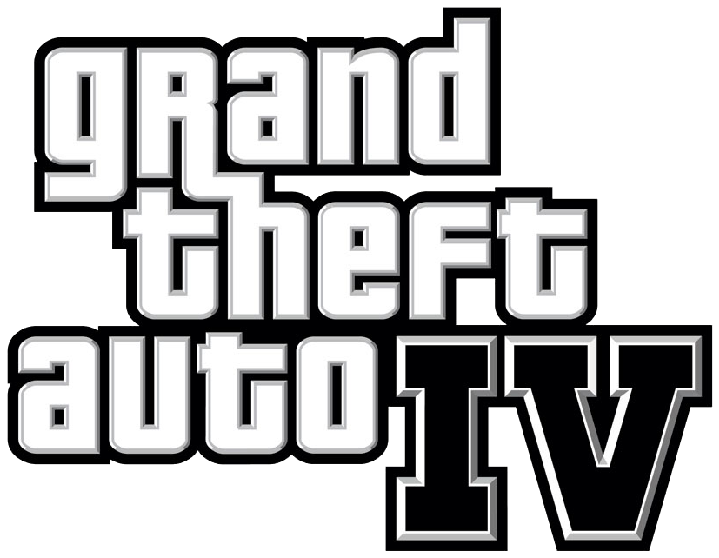

In [16]:
image_name5 = 'latest?cb=20111006102549'
im_data5 = mpimg.imread(image_name5)

cmap = 'hot'
plt.figure(figsize=(15,10))
plt.imshow(im_data5, cmap=cmap, interpolation='nearest')
plt.axis('off')
plt.show()

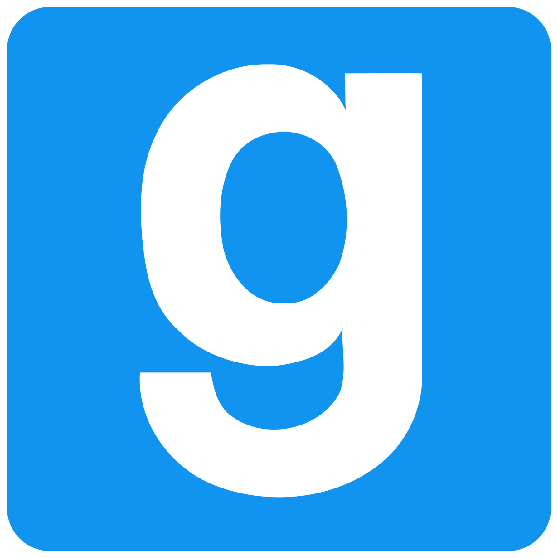

In [17]:
image_name6 = '1200px-Gmodlogo.svg.png'
im_data6 = mpimg.imread(image_name6)

cmap = 'hot'
plt.figure(figsize=(15,10))
plt.imshow(im_data6, cmap=cmap, interpolation='nearest')
plt.axis('off')
plt.show()

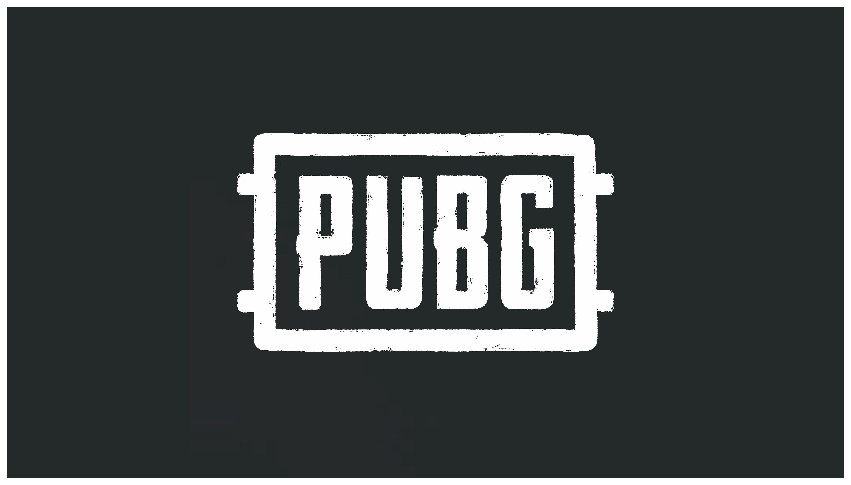

In [18]:
image_name7 = 'f743c45a69f00a4d6254ce42f3803dd1.jpg'
im_data7 = mpimg.imread(image_name7)

cmap = 'hot'
plt.figure(figsize=(15,10))
plt.imshow(im_data7, cmap=cmap, interpolation='nearest')
plt.axis('off')
plt.show()

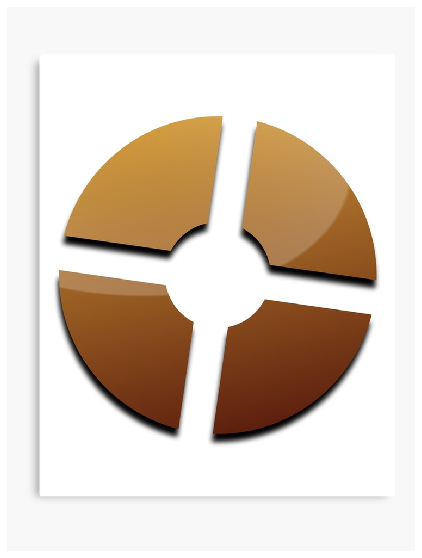

In [19]:
image_name8 = 'mp,840x830,matte,f8f8f8,t-pad,750x1000,f8f8f8.jpg'
im_data8 = mpimg.imread(image_name8)

cmap = 'hot'
plt.figure(figsize=(15,10))
plt.imshow(im_data8, cmap=cmap, interpolation='nearest')
plt.axis('off')
plt.show()

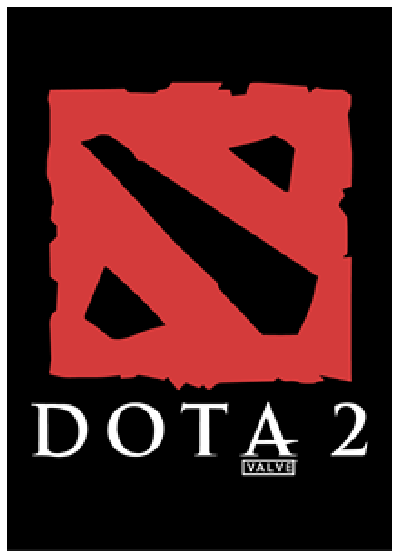

In [20]:
image_name9 = 'dota-2-logo-7804D430C9-seeklogo.com.png'
im_data9 = mpimg.imread(image_name9)

cmap = 'hot'
plt.figure(figsize=(15,10))
plt.imshow(im_data9, cmap=cmap, interpolation='nearest')
plt.axis('off')
plt.show()

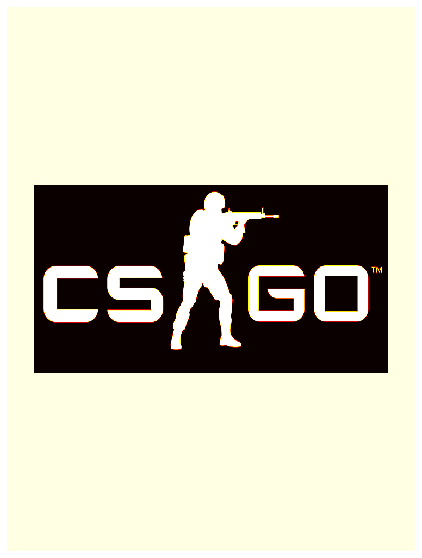

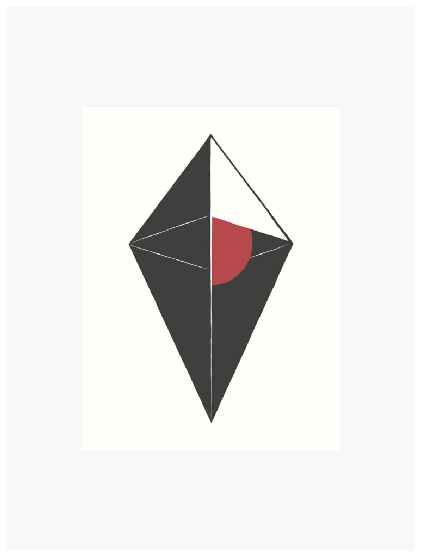

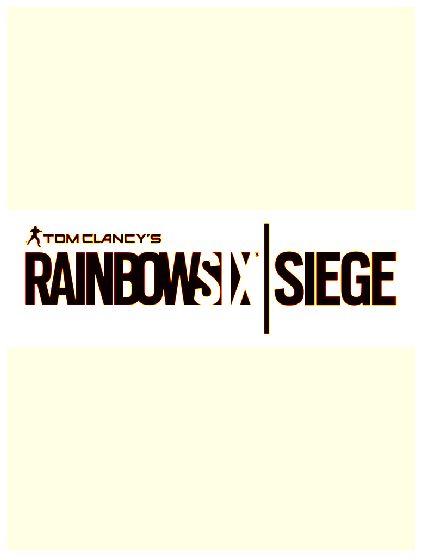

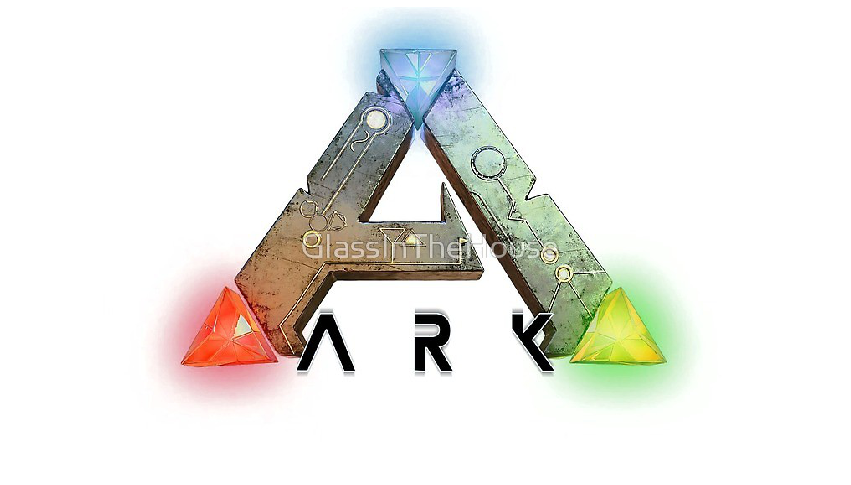

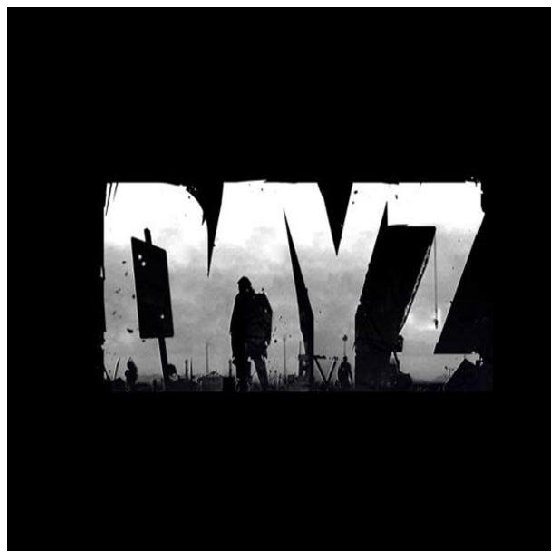

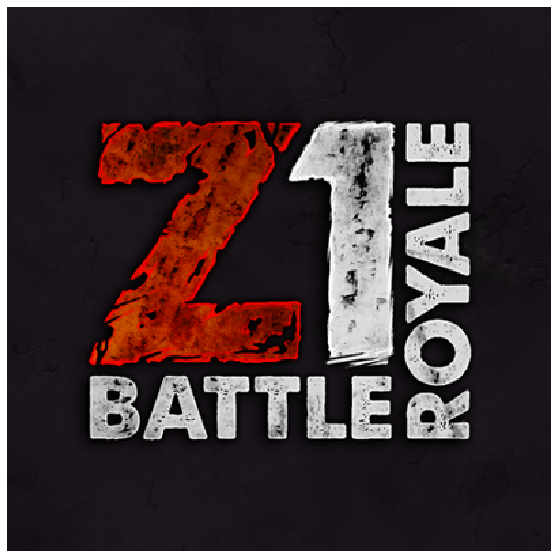

In [21]:
image_name10 = 'pp,650x642-pad,750x1000,f8f8f8.jpg'
im_data10 = mpimg.imread(image_name10)

cmap = 'hot'
plt.figure(figsize=(15,10))
plt.imshow(im_data10, cmap=cmap, interpolation='nearest')
plt.axis('off')
plt.show()

#1
image_name11 = 'aps,650x642,small,transparent-pad,750x1000,f8f8f8.jpg.1'
im_data11 = mpimg.imread(image_name11)

cmap = 'hot'
plt.figure(figsize=(15,10))
plt.imshow(im_data11, cmap=cmap, interpolation='nearest')
plt.axis('off')
plt.show()

#2
image_name12 = 'flat,750x,075,f-pad,750x1000,f8f8f8.jpg'
im_data12 = mpimg.imread(image_name12)

cmap = 'hot'
plt.figure(figsize=(15,10))
plt.imshow(im_data12, cmap=cmap, interpolation='nearest')
plt.axis('off')
plt.show()

#3
image_name13 = 'flat,1000x1000,075,f.u5.jpg.1'
im_data13 = mpimg.imread(image_name13)

cmap = 'hot'
plt.figure(figsize=(15,10))
plt.imshow(im_data13, cmap=cmap, interpolation='nearest')
plt.axis('off')
plt.show()

#4
image_name14 = 'Dayz-Game.jpg.1'
im_data14 = mpimg.imread(image_name14)

cmap = 'hot'
plt.figure(figsize=(15,10))
plt.imshow(im_data14, cmap=cmap, interpolation='nearest')
plt.axis('off')
plt.show()

#5
image_name15 = 'YOkgmHHB_400x400.png.1'
im_data15 = mpimg.imread(image_name15)

cmap = 'hot'
plt.figure(figsize=(15,10))
plt.imshow(im_data15, cmap=cmap, interpolation='nearest')
plt.axis('off')
plt.show()


#Pie Chart
##DID NOT USE FOR THE BLOG POST HOWEVER I STILL LEFT IT ON MY NOTEBOOK

In [0]:

pos_10 = df3.positive_ratings
neg_10 = df3.negative_ratings
name_10 = df3.name

In [0]:
visual = pd.DataFrame({'Names': name_10, 'Pos Rates' : pos_10})
visual_1= visual.sort_values(by='Pos Rates',ascending=True)

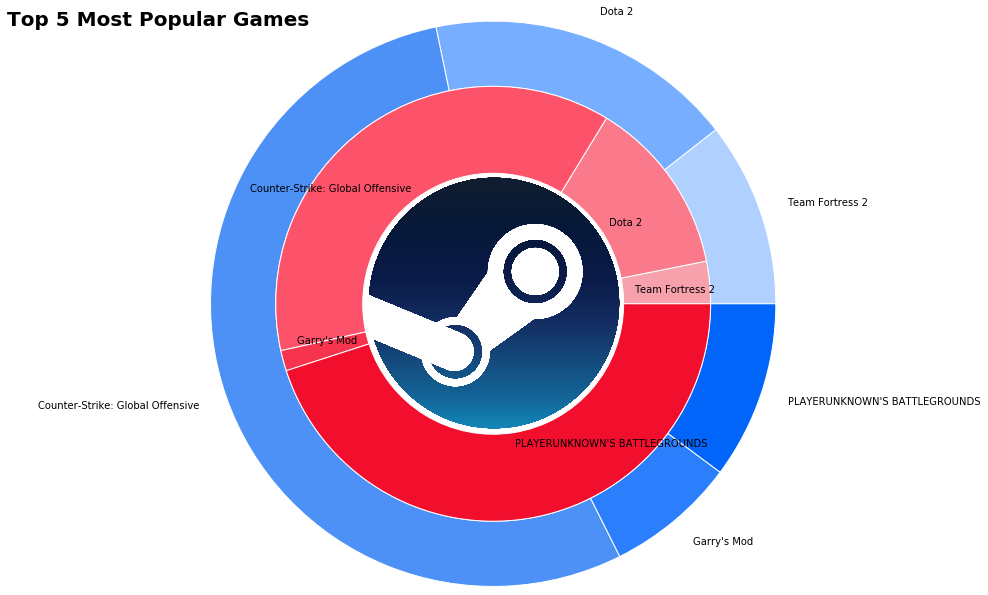

In [24]:
# First Ring (outside)
fig, ax = plt.subplots(figsize=(10,10),facecolor='white')
ax.axis('equal')
mypie, _ = ax.pie(pos_10, radius=1.3,labels=name_10, colors=('#b0d0ff','#78aeff','#4d91f7','#2b7ffc','#0265fa'))
plt.setp( mypie, width=0.3, edgecolor='white')

# Second Ring (Inside)
mypie2, _ = ax.pie(neg_10, radius=1.3-0.3, labels=name_10, labeldistance=0.65,
                   colors=('#f7a1ac','#fa7a8b','#fc536a','#f7344e','#f20f2d'))
plt.setp( mypie2, width=0.4, edgecolor='white')
plt.margins(0,0)
plt.title('Top 5 Most Popular Games', x=-.1, fontsize=20, fontweight='bold')

newax = fig.add_axes([.3227,.3125,.38,.38], anchor='NE')
newax.imshow(im_data)
newax.axis('off')

plt.show()


#Positve Rated Visual

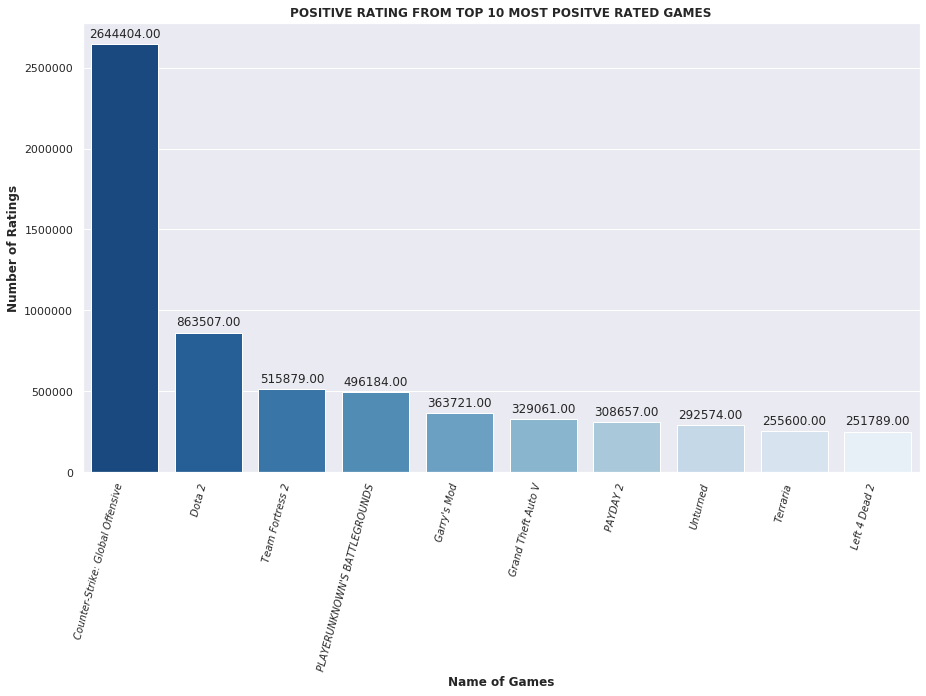

In [25]:
#POS RATING FROM TOP 10 MOST POS RATED GAMES
sns.set(style="darkgrid")
sns.set(rc={'figure.figsize':(15,8.27)})
ax = sns.barplot(x="name", y="positive_ratings", data=df4, palette='Blues_r')
ax.set_title('POSITIVE RATING FROM TOP 10 MOST POSITVE RATED GAMES',
             fontweight='heavy')
ax.set_xlabel('Name of Games', fontweight='heavy')
ax.set_ylabel('Number of Ratings', fontweight='heavy');
for p in ax.patches:
  ax.annotate(format(p.get_height(), '.2f'),
               (p.get_x() + p.get_width() / 2., p.get_height()),
               ha = 'center', va = 'center',
               xytext = (0, 10), textcoords = 'offset points')
ax.set_xticklabels(ax.get_xticklabels(),fontsize=10, rotation=75,ha = 'right',
                   fontweight='light', fontstyle='italic');

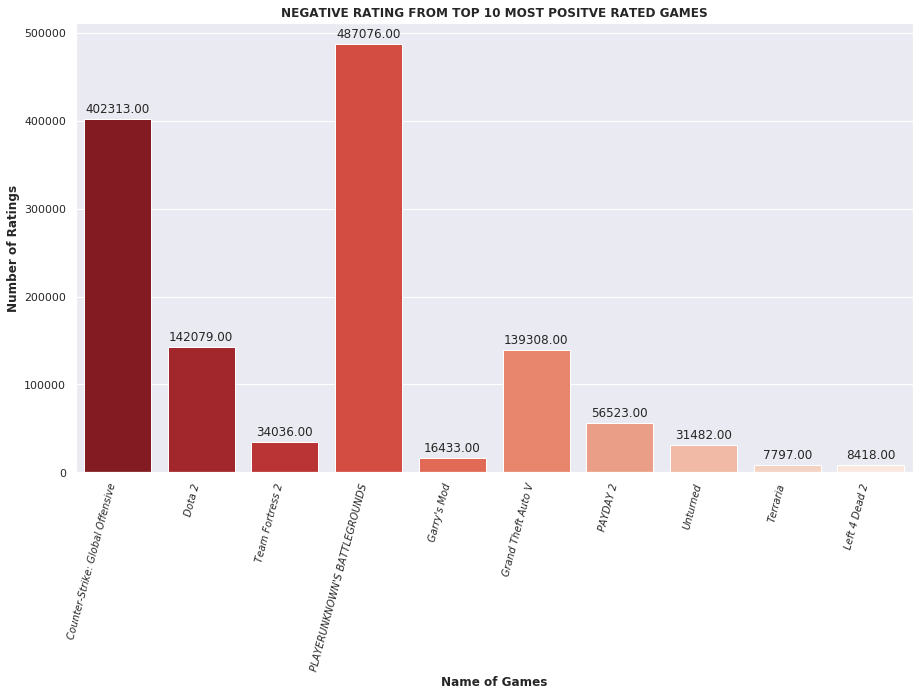

In [26]:
#NEG RATING FROM TOP 10 MOST POS RATED GAMES
sns.set(style="whitegrid")
sns.set(rc={'figure.figsize':(15,8.27)})
ax = sns.barplot(x="name", y="negative_ratings", data=df4,palette='Reds_r')
ax.set_title('NEGATIVE RATING FROM TOP 10 MOST POSITVE RATED GAMES', fontweight='heavy')
ax.set_xlabel('Name of Games', fontweight='heavy')
ax.set_ylabel('Number of Ratings', fontweight='heavy');
for p in ax.patches:
  ax.annotate(format(p.get_height(), '.2f'),
               (p.get_x() + p.get_width() / 2., p.get_height()),
               ha = 'center', va = 'center',
               xytext = (0, 10), textcoords = 'offset points')
ax.set_xticklabels(ax.get_xticklabels(),fontsize=10, rotation=75,ha = 'right',
                   fontweight='light', fontstyle='italic');

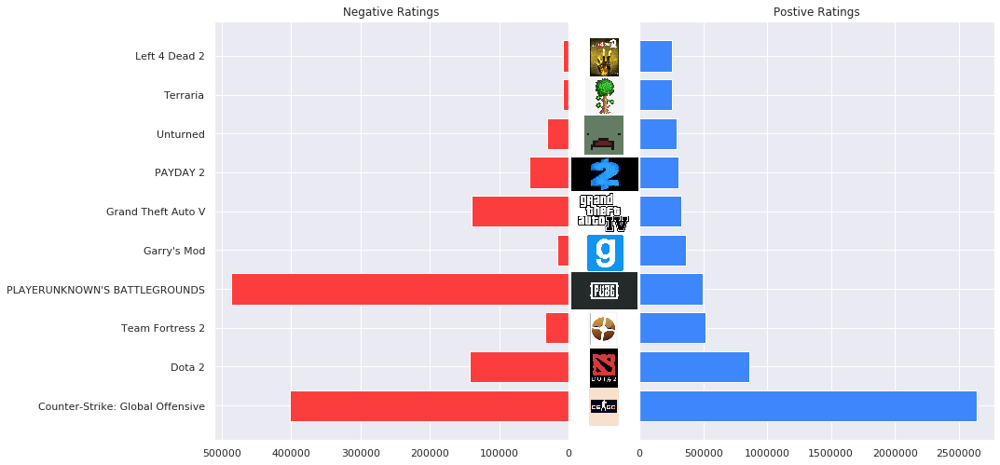

In [27]:
#DOUBLE SIDED BAR PLOT WITH IMAGES
fig, axes = plt.subplots(ncols=2, sharey=True)
axes[1].barh(df4.name, df4.positive_ratings, align='center', color='#3d86fc')
axes[1].set(title='Postive Ratings')
axes[0].barh(df4.name, df4.negative_ratings, align='center', color='#fc3d3d')
axes[0].set(title='Negative Ratings')
axes[0].invert_xaxis()


#L4D2 Logo
newax = fig.add_axes([.457,.78,.07,.07], anchor='NE')
newax.imshow(im_data1)
newax.axis('off')

#Terraria Logo
newax1 = fig.add_axes([.462,.71,.07,.07], anchor='NE')
newax1.imshow(im_data2)
newax1.axis('off')

#Unturned Logo
newax2 = fig.add_axes([.462,.64,.07,.07], anchor='NE')
newax2.imshow(im_data3)
newax2.axis('off')

#Payday2 Logo
newax3 = fig.add_axes([.4765,.574,.07,.06], anchor='NE')
newax3.imshow(im_data4)
newax3.axis('off')

#GTA4 Logo
newax4 = fig.add_axes([.467,.5,.07,.07], anchor='NE')
newax4.imshow(im_data5)
newax4.axis('off')

#Garry's Mod Logo
newax5 = fig.add_axes([.462,.43,.07,.065], anchor='NE')
newax5.imshow(im_data6)
newax5.axis('off')

#PUBG Logo
newax6 = fig.add_axes([.476,.36,.07,.067], anchor='NE')
newax6.imshow(im_data7)
newax6.axis('off')

#TF2 Logo
newax7 = fig.add_axes([.456,.29,.07,.07], anchor='NE')
newax7.imshow(im_data8)
newax7.axis('off')

#Dota2 Logo
newax8 = fig.add_axes([.456,.22,.07,.07], anchor='NE')
newax8.imshow(im_data9)
newax8.axis('off')

#CSGO Logo
newax9 = fig.add_axes([.457,.15,.07,.07], anchor='NE')
newax9.imshow(im_data10)
newax9.axis('off')

plt.show()

#Negative Rated Games

In [28]:
#MADE CONDITIONAL STATEMENT TO SORT DATAFRAM FOR TOP 10 MOST NEGATIVE RATED
condition3 = df.negative_ratings >= 54000
df5 = df[condition3].sort_values(by='negative_ratings', ascending=False)
df5

,appid,name,release_date,english,developer,publisher,platforms,required_age,categories,genres,steamspy_tags,achievements,positive_ratings,negative_ratings,average_playtime,median_playtime,owners,price
12836,578080,PLAYERUNKNOWN'S BATTLEGROUNDS,2017-12-21,1,PUBG Corporation,PUBG Corporation,windows,0,Multi-player;Online Multi-Player;Stats,Action;Adventure;Massively Multiplayer,Survival;Shooter;Multiplayer,37,496184,487076,22938,12434,50000000-100000000,26.99
25,730,Counter-Strike: Global Offensive,2012-08-21,1,Valve;Hidden Path Entertainment,Valve,windows;mac;linux,0,Multi-player;Steam Achievements;Full controlle...,Action;Free to Play,FPS;Multiplayer;Shooter,167,2644404,402313,22494,6502,50000000-100000000,0.00
22,570,Dota 2,2013-07-09,1,Valve,Valve,windows;mac;linux,0,Multi-player;Co-op;Steam Trading Cards;Steam W...,Action;Free to Play;Strategy,Free to Play;MOBA;Strategy,0,863507,142079,23944,801,100000000-200000000,0.00
2478,271590,Grand Theft Auto V,2015-04-13,1,Rockstar North,Rockstar Games,windows,18,Single-player;Multi-player;Steam Achievements;...,Action;Adventure,Open World;Action;Multiplayer,77,329061,139308,9837,4834,10000000-20000000,24.99
7809,433850,Z1 Battle Royale,2018-02-28,1,NantG,Daybreak Game Company,windows,0,Multi-player;Online Multi-Player;In-App Purchases,Action;Adventure;Free to Play;Massively Multip...,Survival;Massively Multiplayer;Multiplayer,0,111434,91664,3142,162,10000000-20000000,0.00
1506,221100,DayZ,2018-12-13,1,Bohemia Interactive,Bohemia Interactive,windows,18,Multi-player;Online Multi-Player;Steam Worksho...,Action;Adventure;Massively Multiplayer,Survival;Zombies;Open World,0,118435,77169,7235,2798,2000000-5000000,33.99
4712,346110,ARK: Survival Evolved,2017-08-27,1,Studio Wildcard;Instinct Games;Efecto Studios;...,Studio Wildcard,windows;mac;linux,0,Single-player;Multi-player;MMO;Co-op;Steam Ach...,Action;Adventure;Indie;Massively Multiplayer;RPG,Survival;Open World;Multiplayer,32,145035,66603,14154,1470,5000000-10000000,44.99
5235,359550,Tom Clancy's Rainbow Six® Siege,2015-12-01,1,Ubisoft Montreal,Ubisoft,windows,0,Single-player;Multi-player;Co-op;Steam Trading...,Action,FPS;Multiplayer;Tactical,0,251178,59620,7504,2543,5000000-10000000,16.99
1467,218620,PAYDAY 2,2013-08-13,1,OVERKILL - a Starbreeze Studio.,Starbreeze Publishing AB,windows;linux,18,Single-player;Multi-player;Co-op;Online Co-op;...,Action;RPG,Co-op;Action;FPS,1130,308657,56523,3975,890,10000000-20000000,7.49
2563,275850,No Man's Sky,2016-08-12,1,Hello Games,Hello Games,windows,0,Single-player;Multi-player;Online Multi-Player...,Action;Adventure,Open World;Space;Exploration,27,63444,56488,2004,1222,1000000-2000000,39.99


In [29]:
#HAD TO SEPERATE THE TWO DIFFERENT OBJECT VALUES IN df.owners to make a new
#column for a float owners with the highest value
df['Owners'] = df.owners.apply(lambda x: x.split('-')[1])
df.head()

,appid,name,release_date,english,developer,publisher,platforms,required_age,categories,genres,steamspy_tags,achievements,positive_ratings,negative_ratings,average_playtime,median_playtime,owners,price,Owners
0,10,Counter-Strike,2000-11-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,124534,3339,17612,317,10000000-20000000,7.19,20000000
1,20,Team Fortress Classic,1999-04-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,3318,633,277,62,5000000-10000000,3.99,10000000
2,30,Day of Defeat,2003-05-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Valve Anti-Cheat enabled,Action,FPS;World War II;Multiplayer,0,3416,398,187,34,5000000-10000000,3.99,10000000
3,40,Deathmatch Classic,2001-06-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,1273,267,258,184,5000000-10000000,3.99,10000000
4,50,Half-Life: Opposing Force,1999-11-01,1,Gearbox Software,Valve,windows;mac;linux,0,Single-player;Multi-player;Valve Anti-Cheat en...,Action,FPS;Action;Sci-fi,0,5250,288,624,415,5000000-10000000,3.99,10000000


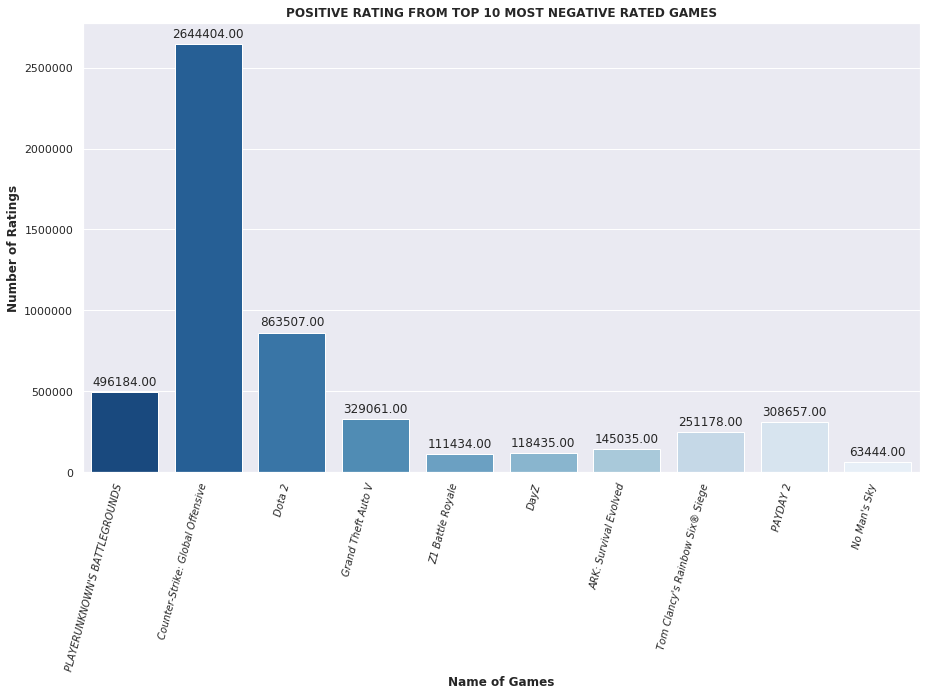

In [30]:
#POSITIVE RATING FOR TOP 10 MOST POS RATINGS
sns.set(style="whitegrid")
sns.set(rc={'figure.figsize':(15,8.27)})
ax = sns.barplot(x="name", y="positive_ratings", data=df5, palette='Blues_r')
ax.set_title('POSITIVE RATING FROM TOP 10 MOST NEGATIVE RATED GAMES', fontweight='heavy')
ax.set_xlabel('Name of Games', fontweight='heavy')
ax.set_ylabel('Number of Ratings', fontweight='heavy');
for p in ax.patches:
  ax.annotate(format(p.get_height(), '.2f'),
               (p.get_x() + p.get_width() / 2., p.get_height()),
               ha = 'center', va = 'center',
               xytext = (0, 10), textcoords = 'offset points')
ax.set_xticklabels(ax.get_xticklabels(),fontsize=10, rotation=75,ha = 'right',
                   fontweight='light', fontstyle='italic');

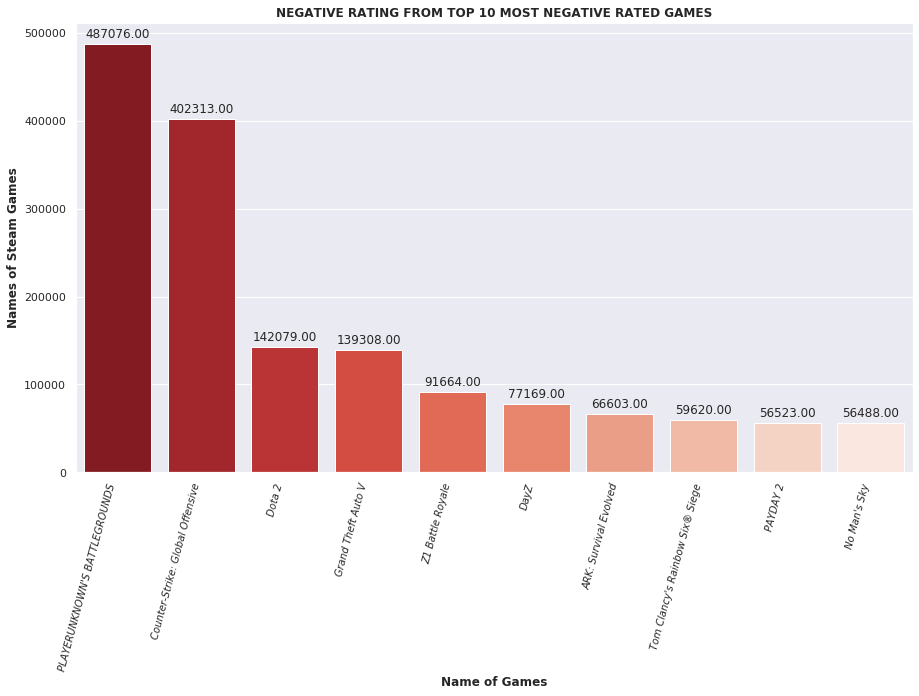

In [31]:
#NEGATIVE RATING FOR TOP TEN NEG RATED GAMES
sns.set(style="whitegrid")
sns.set(rc={'figure.figsize':(15,8.27)})
ax = sns.barplot(x="name", y="negative_ratings", data=df5, palette='Reds_r' )
ax.set_title('NEGATIVE RATING FROM TOP 10 MOST NEGATIVE RATED GAMES', fontweight='heavy')
ax.set_ylabel('Names of Steam Games', fontweight='heavy')
ax.set_xlabel('Name of Games', fontweight='heavy');
for p in ax.patches:
  ax.annotate(format(p.get_height(), '.2f'),
               (p.get_x() + p.get_width() / 2., p.get_height()),
               ha = 'center', va = 'center',
               xytext = (0, 10), textcoords = 'offset points')
ax.set_xticklabels(ax.get_xticklabels(),fontsize=10, rotation=75,ha = 'right',
                   fontweight='light', fontstyle='italic');

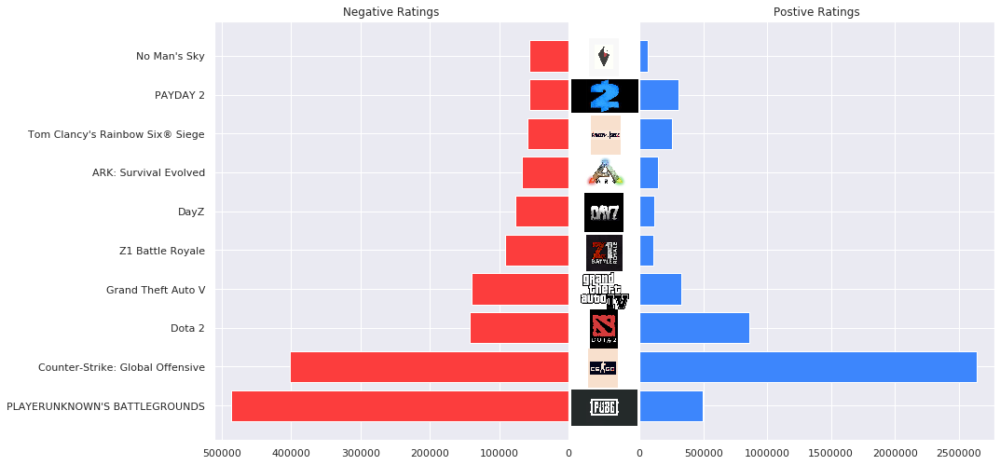

In [32]:
fig, axes = plt.subplots(ncols=2, sharey=True)
axes[1].barh(df5.name, df5.positive_ratings, align='center', color='#3d86fc')
axes[1].set(title='Postive Ratings')
axes[0].barh(df5.name, df5.negative_ratings, align='center', color='#fc3d3d')
axes[0].set(title='Negative Ratings')
axes[0].invert_xaxis()

#Payday2 Logo .462,.71,.07,.07
newax3 = fig.add_axes([.4765,.715,.07,.06], anchor='NE')
newax3.imshow(im_data4)
newax3.axis('off')

#GTA4 Logo .476,.36,.07,.067
newax4 = fig.add_axes([.467,.36,.07,.067], anchor='NE')
newax4.imshow(im_data5)
newax4.axis('off')

#PUBG Logo .457,.15,.07,.07
newax6 = fig.add_axes([.476,.15,.07,.067], anchor='NE')
newax6.imshow(im_data7)
newax6.axis('off')

#Dota2 Logo .456,.29,.07,.07
newax8 = fig.add_axes([.456,.29,.07,.07], anchor='NE')
newax8.imshow(im_data9)
newax8.axis('off')

#CSGO Logo .456,.22,.07,.07
newax9 = fig.add_axes([.456,.22,.07,.07], anchor='NE')
newax9.imshow(im_data10)
newax9.axis('off')

#No Mans Sky .457,.78,.07,.07
newax10 = fig.add_axes([.457,.78,.07,.07], anchor='NE')
newax10.imshow(im_data11)
newax10.axis('off')

#Rainbow Six .462,.64,.07,.07
newax11 = fig.add_axes([.458,.64,.07,.07], anchor='NE')
newax11.imshow(im_data12)
newax11.axis('off')

#ARK .4765,.574,.07,.06
newax12 = fig.add_axes([.473,.574,.07,.06], anchor='NE')
newax12.imshow(im_data13)
newax12.axis('off')

#DayZ .467,.5,.07,.07
newax13 = fig.add_axes([.462,.5,.07,.07], anchor='NE')
newax13.imshow(im_data14)
newax13.axis('off')

#Z1 .462,.43,.07,.065
newax14 = fig.add_axes([.461,.43,.07,.065], anchor='NE')
newax14.imshow(im_data15)
newax14.axis('off');

#Plotly Visualizations

In [0]:

#NEEDED TO USE THIS FUNCTION TO BE ABLE TO RUN MY PLOTLY VISUALIZATIONS

# def configure_plotly_browser_state():
#   import IPython
#   display(IPython.core.display.HTML('''
#         <script src="/static/components/requirejs/require.js"></script>
#         <script>
#           requirejs.config({
#             paths: {
#               base: '/static/base',
#               plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
#             },
#           });
#         </script>
#         '''))

In [34]:
!pip install plotly
!pip install plotly.express

  Using cached https://files.pythonhosted.org/packages/d4/d6/8a2906f51e073a4be80cab35cfa10e7a34853e60f3ed5304ac470852a08d/plotly_express-0.4.1-py2.py3-none-any.whl


In [0]:
import plotly
import plotly.express as px

In [36]:
df['Owners'] = df['Owners'].astype(float)
df.Owners.dtype

dtype('float64')

In [0]:
df['price'] = df['price'] * .1

#Pos Ratings x Average Playtime

In [38]:
df['Genres'] = df.genres.apply(lambda x: x.split(';')[0])
df.head()

,appid,name,release_date,english,developer,publisher,platforms,required_age,categories,genres,steamspy_tags,achievements,positive_ratings,negative_ratings,average_playtime,median_playtime,owners,price,Owners,Genres
0,10,Counter-Strike,2000-11-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,124534,3339,17612,317,10000000-20000000,0.719,20000000.0,Action
1,20,Team Fortress Classic,1999-04-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,3318,633,277,62,5000000-10000000,0.399,10000000.0,Action
2,30,Day of Defeat,2003-05-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Valve Anti-Cheat enabled,Action,FPS;World War II;Multiplayer,0,3416,398,187,34,5000000-10000000,0.399,10000000.0,Action
3,40,Deathmatch Classic,2001-06-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,1273,267,258,184,5000000-10000000,0.399,10000000.0,Action
4,50,Half-Life: Opposing Force,1999-11-01,1,Gearbox Software,Valve,windows;mac;linux,0,Single-player;Multi-player;Valve Anti-Cheat en...,Action,FPS;Action;Sci-fi,0,5250,288,624,415,5000000-10000000,0.399,10000000.0,Action


In [39]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))
configure_plotly_browser_state()
init_notebook_mode(connected=False)
fig = px.scatter(df, x="average_playtime", y="positive_ratings", size="Owners", color="Genres",hover_name="name", log_x=True, size_max=60)
fig.update_layout(template='plotly_white')
fig.update_layout(title='Scatter Plot: Positive Ratings x Average Playtime')
fig.show()

In [40]:
import plotly.io as pio
plotly.offline.plot(fig, filename = 'pxa.html', auto_open=True)

'pxa.html'

#Neg Ratings x Avg Playtime

In [41]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))
configure_plotly_browser_state()
init_notebook_mode(connected=False)
fig2 = px.scatter(df, x="average_playtime", y="negative_ratings", size="Owners", color="Genres",hover_name="name", log_x=True, size_max=60)
fig2.update_layout(template='plotly_white')
fig2.update_layout(title='Scatter Plot: Negative Ratings x Average Playtime')
fig2.show()

In [42]:
plotly.offline.plot(fig2, filename = 'nxa.html', auto_open=True)

'nxa.html'